## 2a


In [9]:
import xml.etree.ElementTree as ET
from pathlib import Path


def _get_bounding_boxes(annotation_file):
    """Extract bounding boxes from the given XML annotation file."""
    tree = ET.parse(annotation_file)
    root = tree.getroot()
    objects = root.findall('object')

    bounding_boxes = []
    for obj in objects:
        bndbox = obj.find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        bounding_boxes.append((xmin, ymin, xmax, ymax))
    return bounding_boxes


class ImageProcessor:
    def __init__(self):
        self.base_path = os.getcwd()
        self.image_path = os.path.join(self.base_path, 'Images')
        self.annotation_path = os.path.join(self.base_path, 'Annotations')
        self.cropped_path = os.path.join(self.base_path, 'Cropped')
        self.breeds = [
            'n02091831-Saluki',
            'n02110806-basenji',
            'n02094258-Norwich_terrier',
            'n02105855-Shetland_sheepdog'
        ]

    def _get_image_path(self, annotation_file):
        """Return the corresponding image path for the given annotation file."""
        image_name = f"{os.path.basename(annotation_file)}.jpg"
        breed_name = os.path.basename(os.path.dirname(annotation_file))
        return os.path.join(self.image_path, breed_name, image_name)

    def _crop_and_save_image(self, image_path, bounding_boxes):
        """Crop the image based on bounding boxes and save the cropped parts."""
        im = Image.open(image_path)
        for idx, box in enumerate(bounding_boxes):
            cropped_image = im.crop(box).resize((100, 100), Image.LANCZOS)
            cropped_image_path = image_path.replace(self.image_path, self.cropped_path).replace('.jpg', f'-{idx}.jpg')
            directory, _ = os.path.split(cropped_image_path)
            Path(directory).mkdir(parents=True, exist_ok=True)
            cropped_image.convert('RGB').save(cropped_image_path)
            print(f"Saved cropped image to {cropped_image_path}")

    def process(self):
        """Main method to process the images using annotations."""
        annotation_files = [os.path.join(self.annotation_path, breed, fname)
                            for breed in self.breeds
                            for fname in os.listdir(os.path.join(self.annotation_path, breed))
                            if not os.path.isdir(os.path.join(self.annotation_path, breed, fname))]

        for idx, annotation in enumerate(annotation_files, start=1):
            print(f"Processing annotation {idx}/{len(annotation_files)}: {annotation}")
            bounding_boxes = _get_bounding_boxes(annotation)
            image_file_path = self._get_image_path(annotation)

            if not os.path.exists(image_file_path):
                print(f"Image file not found: {image_file_path}")
                continue

            self._crop_and_save_image(image_file_path, bounding_boxes)


processor = ImageProcessor()
processor.process()


Processing annotation 1/751: /Users/deep/Documents/Projects/Python Assignment 3/Annotations/n02091831-Saluki/n02091831_2592
Saved cropped image to /Users/deep/Documents/Projects/Python Assignment 3/Cropped/n02091831-Saluki/n02091831_2592-0.jpg
Processing annotation 2/751: /Users/deep/Documents/Projects/Python Assignment 3/Annotations/n02091831-Saluki/n02091831_3675
Saved cropped image to /Users/deep/Documents/Projects/Python Assignment 3/Cropped/n02091831-Saluki/n02091831_3675-0.jpg
Processing annotation 3/751: /Users/deep/Documents/Projects/Python Assignment 3/Annotations/n02091831-Saluki/n02091831_3643
Saved cropped image to /Users/deep/Documents/Projects/Python Assignment 3/Cropped/n02091831-Saluki/n02091831_3643-0.jpg
Processing annotation 4/751: /Users/deep/Documents/Projects/Python Assignment 3/Annotations/n02091831-Saluki/n02091831_5123
Saved cropped image to /Users/deep/Documents/Projects/Python Assignment 3/Cropped/n02091831-Saluki/n02091831_5123-0.jpg
Processing annotation 5/

## 2b

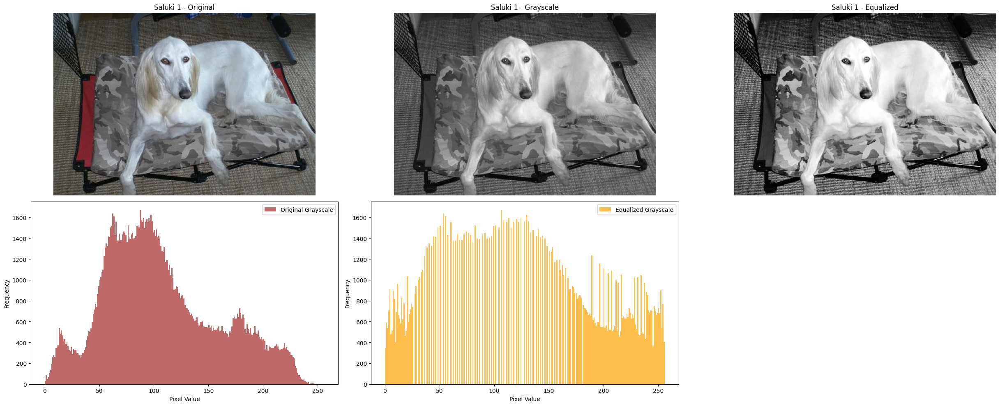

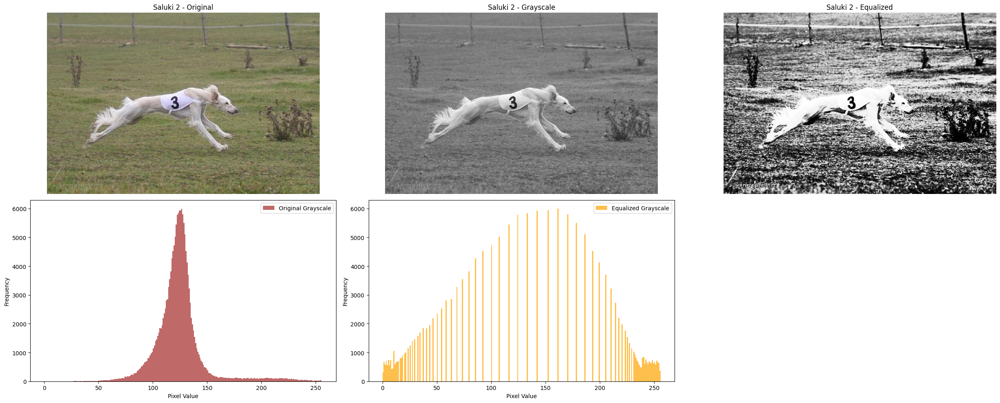

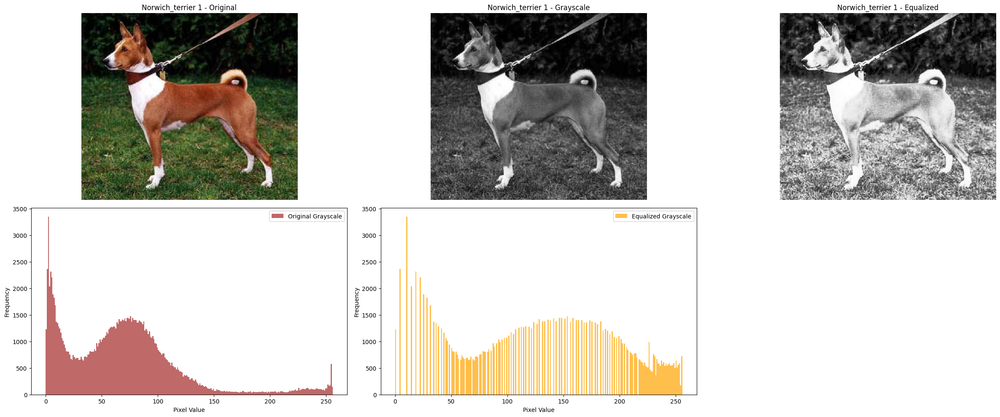

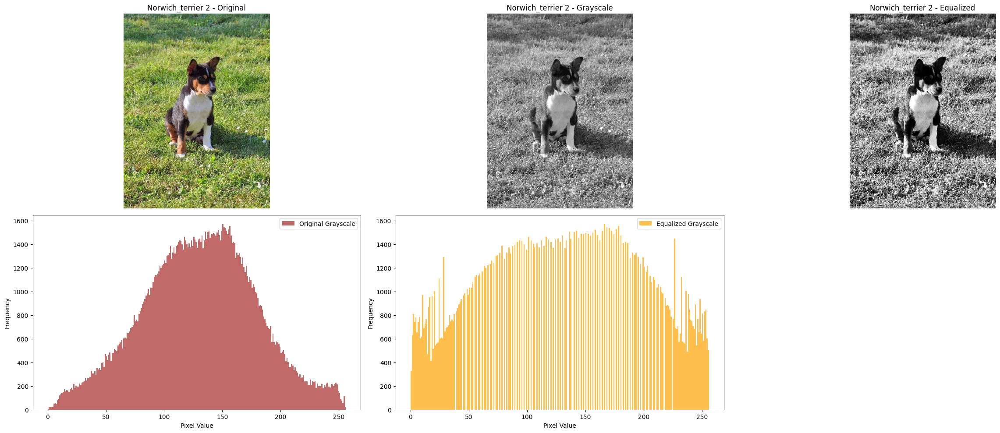

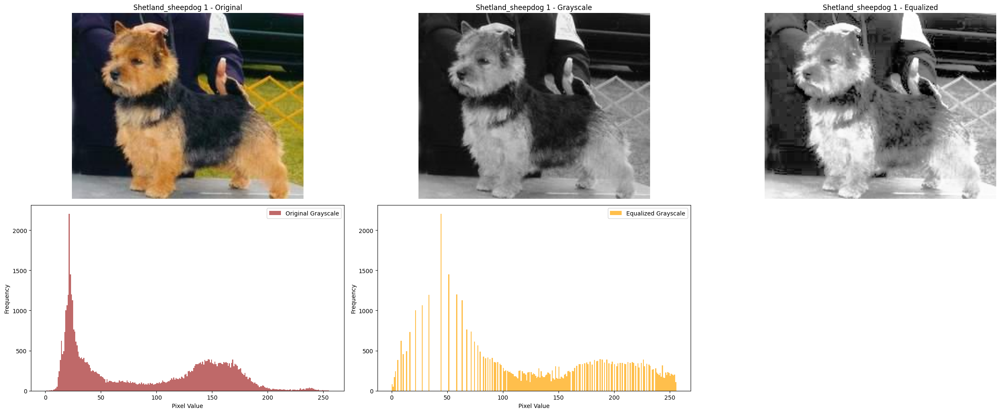

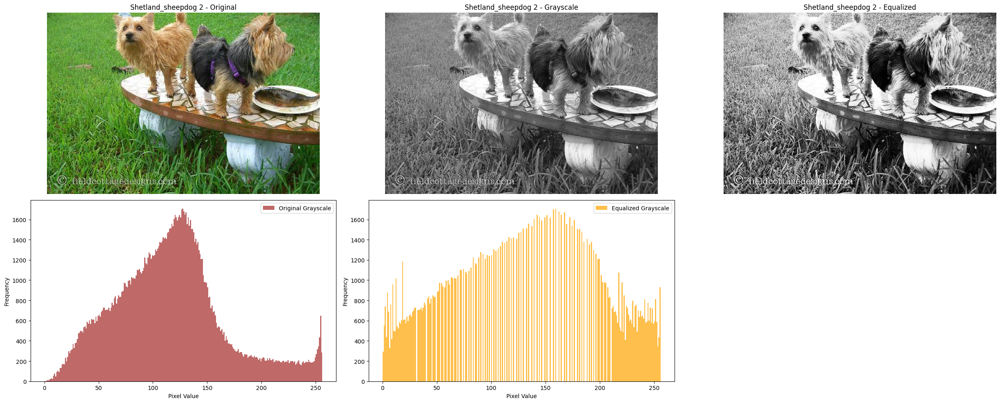

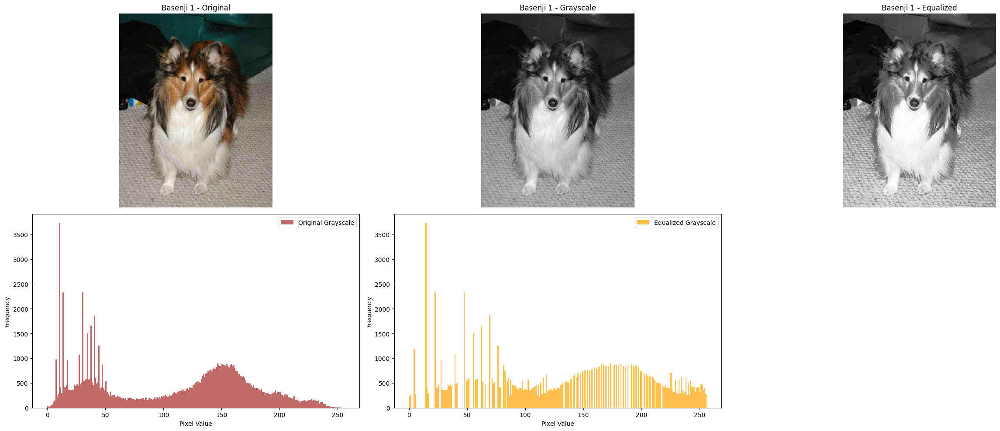

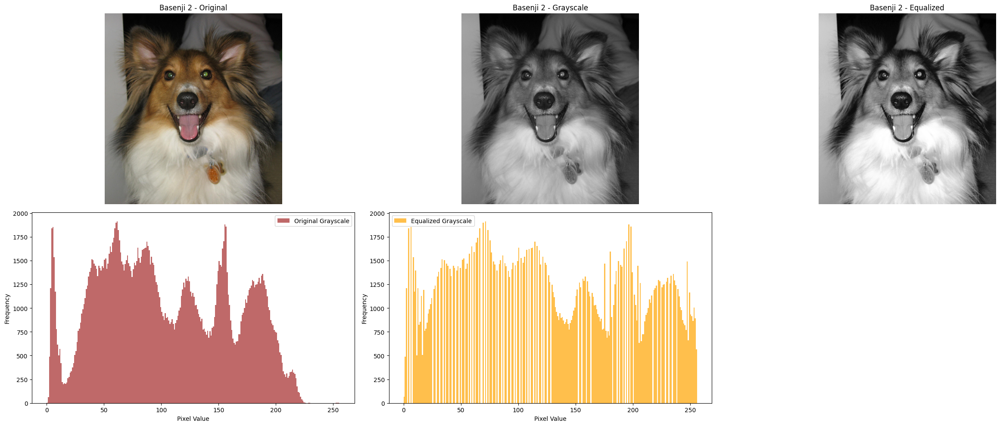

In [10]:
class ImageHandler:
    def __init__(self, folders):
        self.folders = folders

    @staticmethod
    def fetch_images_from_directory(directory, count=2):
        """Retrieve a specified number of images from a given directory."""
        image_files = [file for file in os.listdir(directory) if file.endswith('.jpg')]
        return [cv2.imread(os.path.join(directory, img)) for img in image_files[:count]]

    @staticmethod
    def grayscale_conversion(images):
        """Convert the provided images to grayscale."""
        return [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]

    @staticmethod
    def equalize_image_histograms(grayscale_images):
        """Perform histogram equalization on provided grayscale images."""
        return [cv2.equalizeHist(img) for img in grayscale_images]

    def display_image_comparisons(self, original_images, grayscale_images, equalized_images, image_titles):
        """Display comparison plots for the original, grayscale, and histogram-equalized images."""
        for idx, title in enumerate(image_titles):
            self._comparison_plot(original_images[idx], grayscale_images[idx], equalized_images[idx], title)

    @staticmethod
    def _comparison_plot(img, gray, equalized, title_prefix):
        """Internal method to plot and compare original, grayscale, and histogram-equalized images."""
        plt.figure(figsize=(25, 10))

        # Display the original image
        plt.subplot(2, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{title_prefix} - Original")
        plt.axis('off')

        # Display the grayscale image
        plt.subplot(2, 3, 2)
        plt.imshow(gray, cmap='gray')
        plt.title(f"{title_prefix} - Grayscale")
        plt.axis('off')

        # Display the histogram-equalized image
        plt.subplot(2, 3, 3)
        plt.imshow(equalized, cmap='gray')
        plt.title(f"{title_prefix} - Equalized")
        plt.axis('off')

        # Histogram of original grayscale
        plt.subplot(2, 3, 4)
        plt.hist(gray.ravel(), 256, [0, 256], color='brown', alpha=0.7, label='Original Grayscale')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.legend()

        # Histogram of equalized grayscale
        plt.subplot(2, 3, 5)
        plt.hist(equalized.ravel(), 256, [0, 256], color='orange', alpha=0.7, label='Equalized Grayscale')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.legend()

        plt.tight_layout()
        plt.show()


directories = [
    "Images/n02091831-Saluki", "Images/n02110806-basenji", "Images/n02094258-Norwich_terrier",
    "Images/n02105855-Shetland_sheepdog"

]

handler = ImageHandler(directories)

all_images = [img for directory in directories for img in handler.fetch_images_from_directory(directory)]
grayscale_images = handler.grayscale_conversion(all_images)
equalized_images = handler.equalize_image_histograms(grayscale_images)

titles = [
    "Saluki 1", "Saluki 2", "Norwich_terrier 1", "Norwich_terrier 2", "Shetland_sheepdog 1", "Shetland_sheepdog 2",
    "Basenji 1", "Basenji 2"
]

handler.display_image_comparisons(all_images, grayscale_images, equalized_images, titles)

## 2c

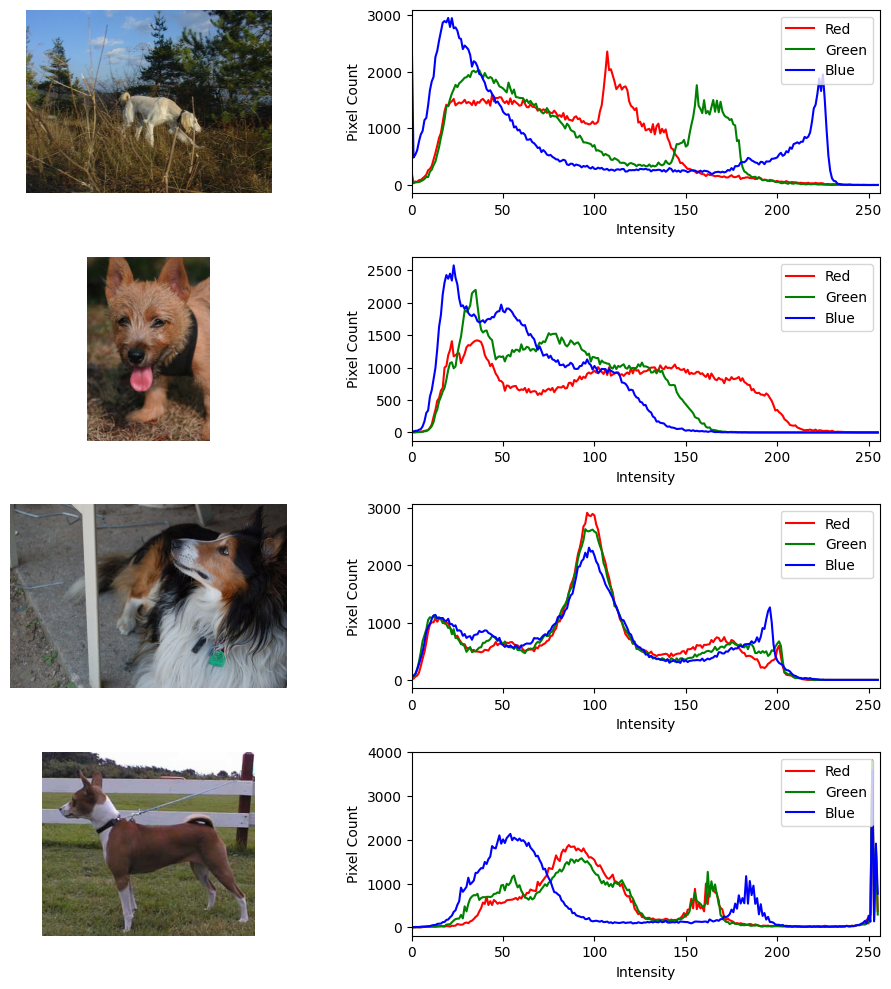

In [5]:
import os
from PIL import Image


class ImageVisualizer:
    def __init__(self, base_directory):
        self.base_directory = base_directory

    def _get_image_paths(self):
        """Construct image paths for specific images from different classes."""
        images_subdir = os.path.join(self.base_directory, 'Images')
        specific_images = [
            ('n02091831-Saluki', 'n02091831_151.jpg'),
            ('n02094258-Norwich_terrier', 'n02094258_72.jpg'),
            ('n02105855-Shetland_sheepdog', 'n02105855_1013.jpg'),
            ('n02110806-basenji', 'n02110806_111.jpg')
        ]
        return [os.path.join(images_subdir, category, img_name) for category, img_name in specific_images]

    def _extract_rgb_histograms(self, image):
        """Extract RGB histograms from a given image."""
        histogram = image.histogram()
        return histogram[0:256], histogram[256:512], histogram[512:768]

    def display_image_histograms(self):
        """Display images alongside their RGB histograms."""
        image_paths = self._get_image_paths()
        fig, axes = plt.subplots(len(image_paths), 2, figsize=(10, 10))

        for idx, img_path in enumerate(image_paths):
            image = Image.open(img_path)

            # Display the image
            axes[idx, 0].imshow(image)
            axes[idx, 0].axis('off')

            # Extract and plot RGB histograms
            red_hist, green_hist, blue_hist = self._extract_rgb_histograms(image)
            axes[idx, 1].plot(red_hist, color='red', label='Red')
            axes[idx, 1].plot(green_hist, color='green', label='Green')
            axes[idx, 1].plot(blue_hist, color='blue', label='Blue')
            axes[idx, 1].set_xlim([0, 256])
            axes[idx, 1].legend(loc="upper right")
            axes[idx, 1].set_xlabel('Intensity')
            axes[idx, 1].set_ylabel('Pixel Count')

        plt.tight_layout()
        plt.show()


visualizer = ImageVisualizer(os.getcwd())
visualizer.display_image_histograms()


## 2d

In [8]:

import numpy as np


class HistogramAnalyzer:
    def __init__(self, image_path):
        self.image_path = image_path
        self.histogram = self._compute_histogram()

    def _compute_histogram(self):
        """Calculate normalized histogram for the image."""
        img = cv2.imread(self.image_path, 0)  # Grayscale loading
        hist = cv2.calcHist([img], [0], None, [256], [0, 256])
        return hist.ravel() / hist.sum()

    def euclidean_dist(self, other_hist):
        return np.linalg.norm(self.histogram - other_hist)

    def manhattan_dist(self, other_hist):
        return np.sum(np.abs(self.histogram - other_hist))

    def bhattacharyya_dist(self, other_hist):
        return -np.log(np.sum(np.sqrt(self.histogram * other_hist)))

    def histogram_intersection_value(self, other_hist):
        return np.sum(np.minimum(self.histogram, other_hist))


def display_comparison(image1, image2, title):
    print(title)
    print("Euclidean Distance:", image1.euclidean_dist(image2.histogram))
    print("Manhattan Distance:", image1.manhattan_dist(image2.histogram))
    print("Bhattacharyya Distance:", image1.bhattacharyya_dist(image2.histogram))
    print("Histogram Intersection:", image1.histogram_intersection_value(image2.histogram))
    print()


Saluki1 = HistogramAnalyzer("Images/n02091831-Saluki/n02091831_151.jpg")
Saluki2 = HistogramAnalyzer("Images/n02091831-Saluki/n02091831_256.jpg")
Basenji = HistogramAnalyzer("Images/n02110806-basenji/n02110806_346.jpg")

display_comparison(Saluki1, Saluki2, "Comparison for images from the same class:")
display_comparison(Saluki1, Basenji, "Comparison for images from different classes:")

Comparison for images from the same class:
Euclidean Distance: 0.05727541
Manhattan Distance: 0.7222369
Bhattacharyya Distance: 0.111167096
Histogram Intersection: 0.63888156

Comparison for images from different classes:
Euclidean Distance: 0.045395907
Manhattan Distance: 0.59964323
Bhattacharyya Distance: 0.08600634
Histogram Intersection: 0.7001784


## 2e

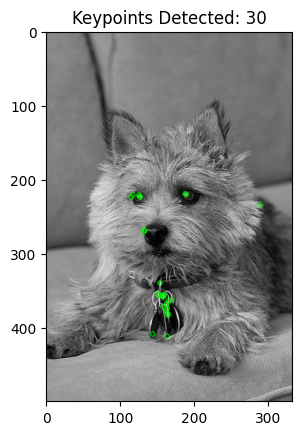

The number of keypoints extracted for this figure are: 30
The Edge Threshold used is: 15
The PatchSize used is: 15


In [11]:



class ORBKeypointExtractor:
    def __init__(self, image_path):
        self.image = cv2.imread(image_path)
        self.gray_image = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)
        self.edge_threshold = 15
        self.patch_size = 15

    def _tune_parameters(self):
        """Iteratively adjust parameters to get a desired number of keypoints."""
        max_iterations = 50
        iteration = 0

        while iteration < max_iterations:
            orb = cv2.ORB_create(edgeThreshold=self.edge_threshold,
                                 patchSize=self.patch_size,
                                 nlevels=8,
                                 fastThreshold=20,
                                 scaleFactor=1.2,
                                 WTA_K=2,
                                 scoreType=cv2.ORB_HARRIS_SCORE,
                                 firstLevel=0,
                                 nfeatures=30)

            keypoints = orb.detect(self.gray_image, None)

            if 25 <= len(keypoints) <= 75:
                return keypoints

            if len(keypoints) < 25:
                self.edge_threshold -= 1
            else:
                self.edge_threshold += 1

            self.patch_size = self.edge_threshold
            iteration += 1
        return keypoints

    def display_keypoints(self):
        """Display the image with keypoints marked."""
        keypoints = self._tune_parameters()
        output_image = cv2.drawKeypoints(self.gray_image, keypoints, self.image, color=(0, 255, 0))

        plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
        plt.title(f"Keypoints Detected: {len(keypoints)}")
        plt.show()

        print(f"The number of keypoints extracted for this figure are: {len(keypoints)}")
        print(f"The Edge Threshold used is: {self.edge_threshold}")
        print(f"The PatchSize used is: {self.patch_size}")


chihuahua_image = ORBKeypointExtractor(
    "Images/n02094258-Norwich_terrier/n02094258_103.jpg")  # Replace with your image path
chihuahua_image.display_keypoints()


## 2f

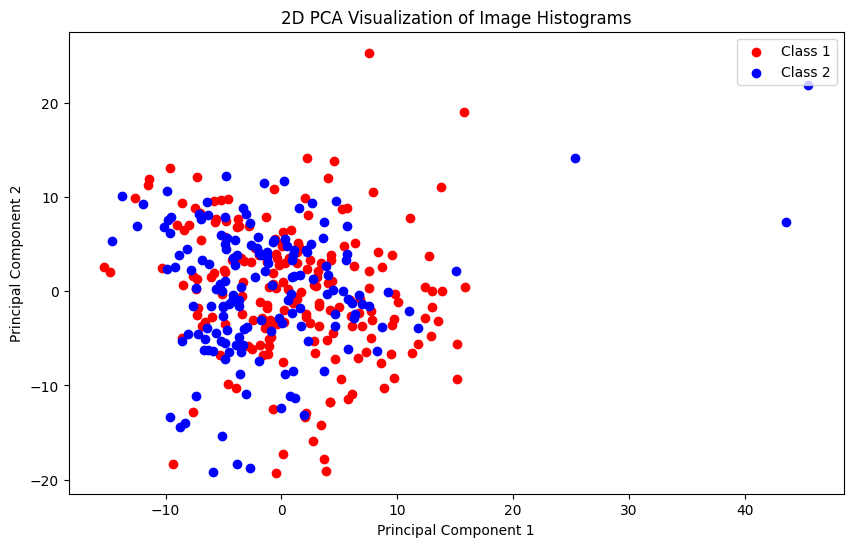

In [12]:
import cv2
import os
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


class ImageHistogramPCA:
    def __init__(self, folder_path_1, folder_path_2):
        self.folder_path_1 = folder_path_1
        self.folder_path_2 = folder_path_2

    @staticmethod
    def _compute_histogram(image_path):
        """Compute grayscale histogram for the given image."""
        image = cv2.imread(image_path)
        grayscale = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        histogram = cv2.calcHist([grayscale], [0], None, [256], [0, 256])
        return histogram.ravel()

    def _load_histograms(self):
        """Load histograms for all images in the provided folders."""
        histograms_data = []
        for folder in [self.folder_path_1, self.folder_path_2]:
            for filename in os.listdir(folder):
                hist = self._compute_histogram(os.path.join(folder, filename))
                histograms_data.append(hist)
        return histograms_data

    def visualize_pca(self):
        """Visualize the PCA results in 2D."""
        histograms = self._load_histograms()

        # Normalize the data
        histograms = StandardScaler().fit_transform(histograms)

        # Apply PCA for dimensionality reduction to 2D
        pca_processor = PCA(n_components=2)
        transformed_data = pca_processor.fit_transform(histograms)

        plt.figure(figsize=(10, 6))
        plt.scatter(transformed_data[:len(os.listdir(self.folder_path_1)), 0],
                    transformed_data[:len(os.listdir(self.folder_path_1)), 1], c='r', label="Class 1")
        plt.scatter(transformed_data[len(os.listdir(self.folder_path_1)):, 0],
                    transformed_data[len(os.listdir(self.folder_path_1)):, 1], c='b', label="Class 2")
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.title('2D PCA Visualization of Image Histograms')
        plt.legend()
        plt.show()


class1_path = "Images/n02091831-Saluki"
class2_path = "Images/n02105855-Shetland_sheepdog"

pca_visualizer = ImageHistogramPCA(class1_path, class2_path)
pca_visualizer.visualize_pca()
